In [26]:
from __future__ import division

# **Advanced Lane Finding** 
***
GOALS:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [24]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import pickle
import glob
from collections import deque
from sklearn.metrics import mean_absolute_error
%matplotlib inline
import os

### *Camera Calibration*
***
Image distortion occurs when a camera looks at 3D objects in real world  and transforms them into a 2D image - this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. The reason for this is that we use lenses in our camera system. They cause the light rays often to bend a little too much or too little at the edges of these lenses.
So, the first step in analyzing camera images, is to undo this distortion so that you can get correct and useful information out of them.
Distortion correction is very important in the field of surveillance of the environment with optical systems as 
Distortion (if not corrected)changes or makes:
  * apparent size of an object in an image
  * apparent shape of an object in an image
  * an object's apprearance depending on where it's in the field of view
  * object's appear closer/farther away than they actually are

***

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


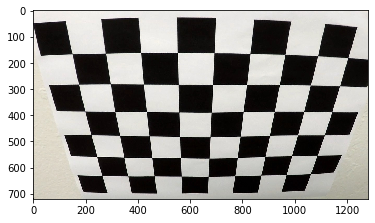

In [2]:
#reading in an image
image = mpimg.imread('camera_cal/calibration2.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)

camera_cal\calibration10.jpg


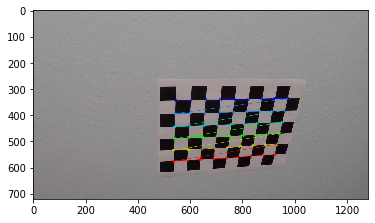

camera_cal\calibration11.jpg


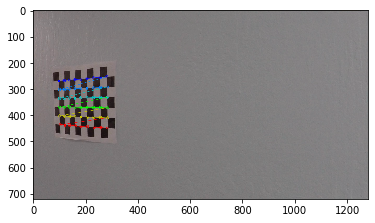

camera_cal\calibration12.jpg


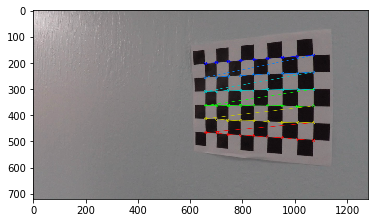

camera_cal\calibration13.jpg


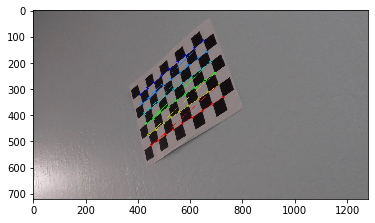

camera_cal\calibration14.jpg


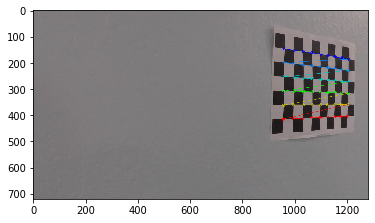

camera_cal\calibration15.jpg


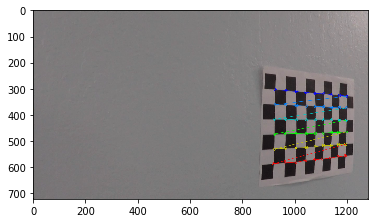

camera_cal\calibration16.jpg


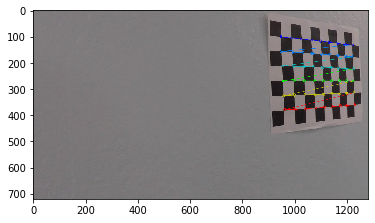

camera_cal\calibration17.jpg


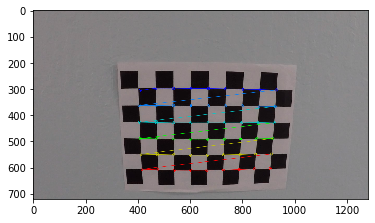

camera_cal\calibration18.jpg


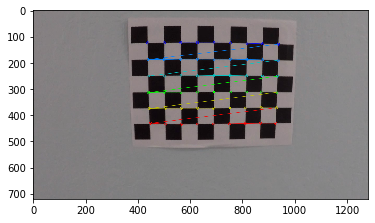

camera_cal\calibration19.jpg


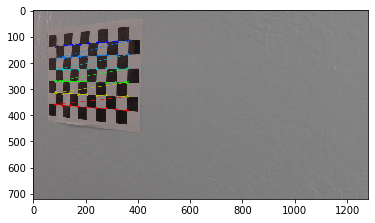

camera_cal\calibration2.jpg


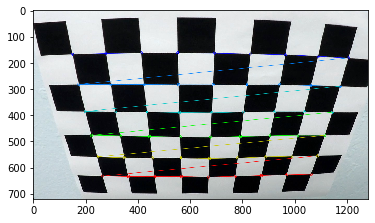

camera_cal\calibration20.jpg


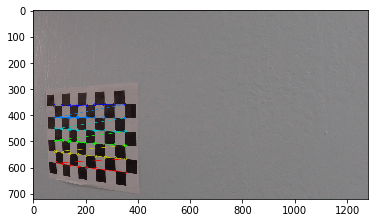

camera_cal\calibration3.jpg


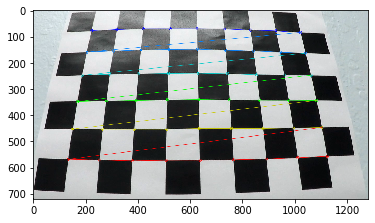

camera_cal\calibration6.jpg


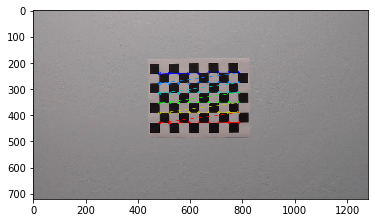

camera_cal\calibration7.jpg


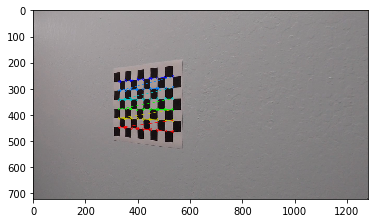

camera_cal\calibration8.jpg


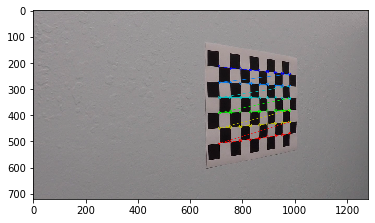

camera_cal\calibration9.jpg


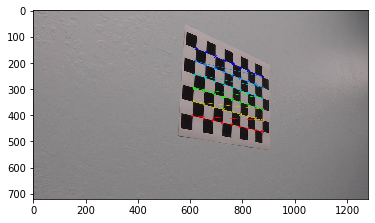

In [3]:
# prepare object points
nx = 9
ny = 6
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# arrays to store object points and image points from all the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x,y coordinates

# procedure for each image
for fname in images:
    # read in each image
    img = cv2.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # If found, add object points and image points (draw corners)
    if ret == True:
        # object and image points
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        print(fname)
        plt.imshow(img)
        plt.show()
# save the object and imagepoints in a file    
#dist_pickle = {}
#dist_pickle["objpoints"] = objpoints
#dist_pickle["imgpoints"] = imgpoints
#pickle.dump( dist_pickle, open( "calibration_camera/obj_imgpoints_pickle.p", "wb" ) )  

True

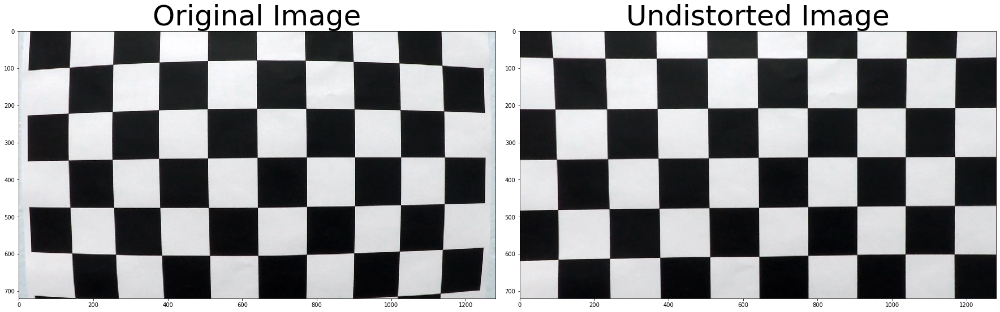

In [8]:
# Calibrate Camera and undistort picture
# Read in an test-image
img = cv2.imread('camera_cal/calibration1.jpg')

# function that takes an image, object points and image points
# performs the camera calibration
def cal_camera(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    # Save the camera calibration result for later use
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    dist_pickle["rvecs"] = rvecs
    dist_pickle["tvecs"] = tvecs
    pickle.dump( dist_pickle, open( "calibration_camera/camera_cal_pickle.p", "wb" ) )    
    return

# function that takes an image and the camera matrix, distortion coefficients
# and returns the undistorted image
def cal_undistort_1(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)  
    return undist

# calculate the camera matrix and distortion coefficient once
cal_camera(img, objpoints, imgpoints)

# load the camera matrix and distortion coefficient
dist_pickle = pickle.load( open( "calibration_camera/camera_cal_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
# calculate the undistort image
undistorted = cal_undistort_1(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

cv2.imwrite('output_images/test_undist.jpg',undistorted)

### *Masking and Thresholding*
***
One important step in creating a successful algorithm for a self-driving car is the correct detection of the driving lanes. In this project we should read image – frames, identify the lanes, perform a perspective transformation and calculat the curveature of the lane. This is a basic step to predict the correct steering angle.

At this point I will deal with the image process needed to identify the lanes. Therefore I  defined several possibilities to mask and threshold the images to accurately determine the lane lines even under worse conditions like shadows and lower brightness. 
***

In [9]:
# load the camera matrix and distortion coefficient
def camera_matrix():
    dist_pickle = pickle.load( open( "calibration_camera/camera_cal_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    return mtx, dist

def cal_undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)  
    return undist

def region_of_interest(img):
    #Applies an image mask.
    #Only keeps the region of the image defined by the polygon
    #formed from `vertices`. The rest of the image is set to black.
    # Defining a four sided polygon to mask
    imshape = img.shape
#    vertices = np.array([[(0.1*imshape[1],imshape[0]),(0.48*imshape[1], imshape[0]/1.7), \
#            (0.52*imshape[1], imshape[0]/1.7), (0.95*imshape[1],imshape[0])]], dtype=np.int32)
    vertices = np.array([[(0.*imshape[1],imshape[0]),(0.45*imshape[1], imshape[0]/1.8), \
            (0.55*imshape[1], imshape[0]/1.8), (0.99*imshape[1],imshape[0])]], dtype=np.int32)
    #defining a blank mask to start with
    mask = np.zeros_like(img)    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
#        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 1 
#        ignore_mask_color = 255    
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)   
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # Return the binary image
    return mag_binary

def dir_threshold(image, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
     # Calculate gradient direction
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    # Return the binary image
    return dir_binary

def combined_thresh(img, SOBEL_KERNEL=3, THRESH=(0, 255), MAG_THRESH=(0,255),  DIR_TRESH=(0, np.pi/2)):
    # 1) Convert to grayscale
#    gray=cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    comb_img =  img#[:,:,0]
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(comb_img, orient='x', sobel_kernel=SOBEL_KERNEL, thresh=THRESH)
    grady = abs_sobel_thresh(comb_img, orient='y', sobel_kernel=SOBEL_KERNEL, thresh=THRESH)
    mag_binary = mag_thresh(comb_img, sobel_kernel=SOBEL_KERNEL, mag_thresh=MAG_THRESH)
    dir_binary = dir_threshold(comb_img, sobel_kernel=SOBEL_KERNEL, dir_thresh=DIR_TRESH)
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

def channel_tresh(img,CHL_TRESH=(0, 255)):
    s_binary = np.zeros_like(img)
    s_binary[(img > CHL_TRESH[0]) & (img <= CHL_TRESH[1])] = 1
    return s_binary

def img_persp(img):
    # 1) determine manually the source points
#    src = np.float32([[249, 690],[540, 490],[749, 490],[1058, 690]])
    src = np.float32([[249, 690],[579, 460],[704, 460],[1058, 690]])
    # 2) define 4 destination points
    x_max = img.shape[1]
    y_max = img.shape[0]
    img_size = (img.shape[1],img.shape[0])
    offset = 0
    dst = np.float32([[249, y_max],[249, offset],[1058, offset],[1058, y_max]])
    # 3) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # 4) use cv2.getPerspectiveTransform() to get inv_M by swapping dst and src
    inv_M = cv2.getPerspectiveTransform(dst, src)
    # 5) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR) 
    return warped, M, inv_M

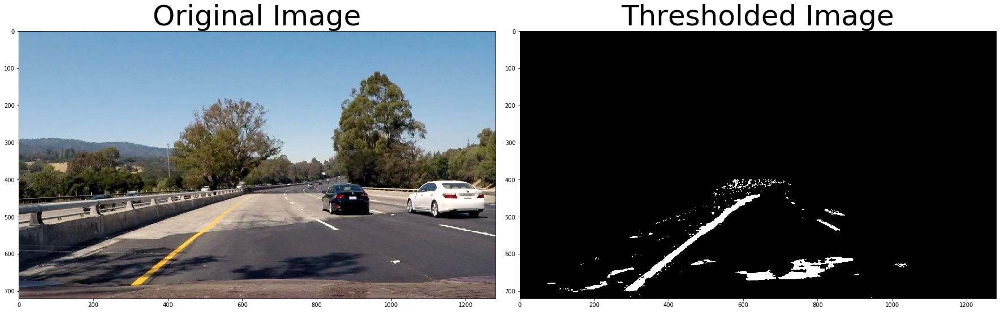

In [10]:
# Read in an image
#img = cv2.imread('test_images/straight_lines2.jpg')
img = cv2.imread('test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
c_mtx, c_dist = camera_matrix()
# calculate the undistort image
undist_img = cal_undistort(img, c_mtx, c_dist)
### Combine the thresholds
### only R channel
R_channel = undist_img[:,:,0]
R_comb_bin = combined_thresh(R_channel, SOBEL_KERNEL=3, THRESH=(210, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.7, 1.2))
#R_comb_bin = dir_threshold(channel_tresh(R_channel,CHL_TRESH=(210, 255)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
#R_comb_bin = channel_tresh(R_channel,CHL_TRESH=(210, 255)) #best pick
# mask image
msk_R_bin = region_of_interest(R_comb_bin)#.astype(np.float)

### Combine the thresholds
### only H channel
hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS).astype(np.float)
h1_channel = hls[:,:,0]
#H_comb_bin = combined_thresh(h1_channel, SOBEL_KERNEL=9, THRESH=(20, 80), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
H_comb_bin = dir_threshold(channel_tresh(h1_channel,CHL_TRESH=(20, 80)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
#H_comb_bin = channel_tresh(h1_channel,CHL_TRESH=(20, 80))
# mask image
msk_H_bin = region_of_interest(H_comb_bin)

### only grayscale cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
G_channel = cv2.cvtColor(undist_img, cv2.COLOR_RGB2GRAY)
G_comb_bin = combined_thresh(G_channel, SOBEL_KERNEL=3, THRESH=(100, 200), MAG_THRESH=(10, 225), DIR_TRESH=(0.7, 1.2))
#G_comb_bin = dir_threshold(channel_tresh(G_channel,CHL_TRESH=(100, 200)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
#G_comb_bin = channel_tresh(G_channel,CHL_TRESH=(100, 200)) #best pick
# mask image
msk_G_bin = region_of_interest(G_comb_bin)#.astype(np.float)

### only S channel
s1_channel = hls[:,:,2]
#S_comb_bin = combined_thresh(l1_channel, SOBEL_KERNEL=9, THRESH=(85, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.6, 1.3))
#S_comb_bin = dir_threshold(channel_tresh(s1_channel,CHL_TRESH=(85, 255)), sobel_kernel=3, dir_thresh=(0.6, 1.3))
S_comb_bin = channel_tresh(s1_channel,CHL_TRESH=(85, 255)) #best pick
# mask image
msk_S_bin = region_of_interest(S_comb_bin)

#comb_binary = np.dstack(( S_comb_bin, H_comb_bin, R_comb_bin))

stack_binary = np.dstack(( msk_S_bin,msk_H_bin ,msk_R_bin))
# Combine the three binary thresholds
#comb_binary = np.zeros_like(msk_H_bin)
#comb_binary[(msk_R_bin == 1) | (msk_H_bin == 1)| (msk_S_bin == 1)] = 1

comb_binary = cv2.bitwise_or(msk_R_bin*1.,cv2.bitwise_or(msk_S_bin, msk_H_bin))
#comb_binary = cv2.bitwise_or(msk_R_bin*1., msk_H_bin)
#comb_binary = msk_S_bin

# Otsu's thresholding after Gaussian filtering
#comb_binary = (comb_binary*255).astype(np.uint8)
#blur = cv2.GaussianBlur(comb_binary,(5,5),0)
#ret3,comb_binary = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
#ax2.imshow(stack_binary[:,:,2], cmap='gray')
#ax2.imshow(undist_img, cmap='gray')
ax2.imshow(comb_binary, cmap='gray')
#ax2.set_title('Undistorted Image', fontsize=50)
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

#cv2.imwrite('output_images/test4_undist_001.jpg',comb_binary*255.)

# Perspective transform
***
The goal of this step is to transform the undistorted image to a "birds eye view" of the road. This perspective transform is very similar to the process of the undistortion transform. In this process we don't map object points to image points, but map points in a given image to diverse image points which represent a new perspective. Here we are interested in the perspective of the "birds eye view" so that we can concentrate on the lanes seen from above. Those lines should be relatively parallel to each other. This perspective will be very useful for calculation of the lane curvature. I will use the OpenCV functions getPerspectiveTransform and warpPerspective to perform the transformation. To create a perspective transformation, we'll first select four points that define a rectangle on a plane in the original image. Then we'll select where we want those same four points to appear in the warped image.

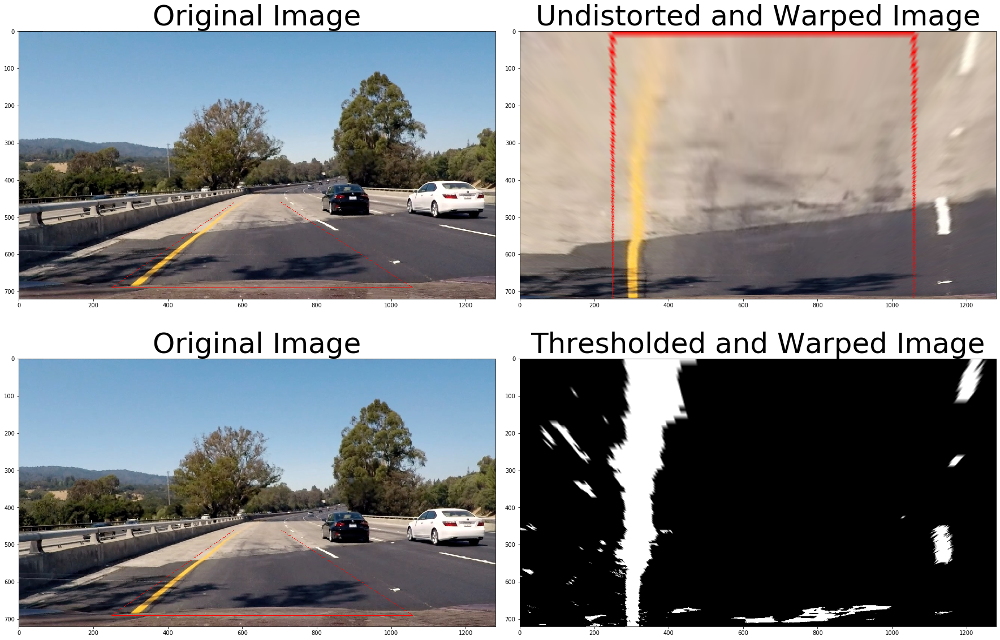

In [11]:
img_points = []

# prepare the difined search points for printing in image
src = np.float32([[249, 690],[579, 460],[704, 460],[1058, 690]])
l = len(src)
lines = [[[src[i][0],
           src[i][1],
           src[(i+1) % l][0],
           src[(i+1) % l][1]]] for i in range(l)]

for line in lines:
    for x1, y1, x2, y2 in line:
        cv2.line(img, (x1, y1), (x2, y2), color=[255, 0, 0], thickness=1)

# load camera matrix and undistort, warp image
c_mtx, c_dist = camera_matrix()
#undist_img_2 = cal_undistort(img, c_mtx, c_dist)
undist_img = cal_undistort(img, c_mtx, c_dist)
top_down_2, perspective_M , inv_M = img_persp(img)
top_down, perspective_M , inv_M = img_persp(comb_binary)
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_2, cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=50)
ax3.imshow(img, cmap='gray')
ax3.set_title('Original Image', fontsize=50)
ax4.imshow(top_down, cmap='gray')
ax4.set_title('Thresholded and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=1.7, bottom=0)

### posibility to save the images to files    
#image_sv = cv2.cvtColor(undist_img, cv2.COLOR_RGB2BGR)
#image_sv = undist_img*255.
#cv2.imwrite('output_images/straight_lines1_src_002.jpg',image_sv)
#image_sv2 = cv2.cvtColor(top_down, cv2.COLOR_RGB2BGR)
#image_sv2 = top_down*255.
#cv2.imwrite('output_images/straight_lines1_bird_eye_002.jpg',image_sv2)

# Histogram of sum of pixels in the lower half of image

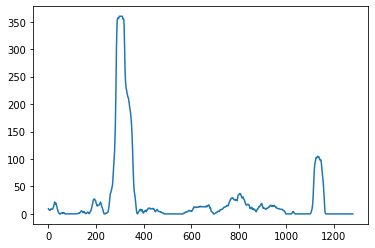

In [12]:
histogram = np.sum(top_down[int(top_down.shape[0]/2):,:], axis=0)
plt.plot(histogram)

In [13]:
#from sklearn import linear_model, datasets
#from skimage.transform import PolynomialTransform

from sklearn.linear_model import (RANSACRegressor, HuberRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

def Interpol_RanSac(X, y, x_plot):
    X = X.reshape(-1, 1)
    y = y.reshape(-1, 1)
    estimators = [('RANSAC', RANSACRegressor(max_trials = 100, min_samples = 150, \
                                             loss = "absolute_loss", \
                                             residual_threshold=15.0,random_state=0))]#,
#              ('HuberRegressor', HuberRegressor())]
#    colors = {'RANSAC': 'lightgreen'}#, 'HuberRegressor': 'black'}
#    linestyle = {'RANSAC': '--'}#, 'HuberRegressor': '--'}
#    lw = 3

    for name, estimator in estimators:
        model = make_pipeline(PolynomialFeatures(2), estimator)
        model.fit(X, y)
#        mse = mean_squared_error(model.predict(X_test), y_test)
        y_plot = model.predict(x_plot[:, np.newaxis])
#        plt.plot(x_plot, y_plot, color=colors[name], linestyle=linestyle[name],
#                     linewidth=lw, label='%s: ' % (name))
#                     linewidth=lw, label='%s: error = %.3f' % (name, mse))
    return y_plot

In [14]:
### Implementation of a sliding window and Polynomial Fit
def slide_win_poly(top_down, plot_poly):
    top_down2 = (top_down*255).astype(np.uint8)
    #cv2.convertScaleAbs(top_down, top_down2)

    # Take a histogram of the bottom half of the image
    ###histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    histogram = np.sum(top_down2[int(top_down2.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((top_down2, top_down2, top_down2))#*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(top_down.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = top_down2.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 75
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = top_down2.shape[0] - (window+1)*window_height
        win_y_high = top_down2.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]      
        if len(good_left_inds) < 9500:
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
        if len(good_right_inds) < 9500:    
            right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, top_down2.shape[0]-1, top_down2.shape[0])
    
    # Fit with RANSAC
    L_RAN_xplot = Interpol_RanSac(lefty, leftx, ploty)
    R_RAN_xplot = Interpol_RanSac(righty, rightx, ploty)
    
   
    if plot_poly:
        
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
#        plt.imshow(out_img)
#        plt.xlim(0, 1280)
#        plt.ylim(720, 0)
#        plt.plot(left_fitx, ploty, color='yellow')
#        plt.plot(right_fitx, ploty, color='yellow')
#        plt.title('Polynomial Approximation Image', fontsize=20)        

        plt.imshow(out_img)
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.plot(L_RAN_xplot, ploty, color='magenta')
        plt.plot(R_RAN_xplot, ploty, color='magenta')
        plt.title('RANSAC Approximation Image', fontsize=20) 
#    return L_RAN_xplot, R_RAN_xplot, ploty, out_img, leftx, lefty, rightx, righty
    return left_fit, right_fit, ploty, out_img, leftx, lefty, rightx, righty

#left_fit, right_fit, ploty, out_img, leftx, lefty, rightx, righty = slide_win_poly(top_down, True)


In [15]:
def nxt_win_poly(top_down,left_fit, right_fit, plot_poly):
    binary_warped= (top_down*255).astype(np.uint8)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin))\
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin))\
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    if plot_poly:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        
        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    return left_fit, right_fit, out_img, leftx, lefty, rightx, righty


## Measuring Curvature
After identifying the lane lines and transforming the lane line pixels in a function form, we are now able to calculate the curvature of the lane and the position of the car in respect to the lane middle. This was done using the formula given in the project introduction. Here calculated with the conversion factors pixel to meter in x and y direction so that the result is in [m]. 
To calculate the position of the car we first determine the position of the lanes in the image and assume that the camera position is right in the middle of the car.

In [16]:
def meas_curvature_m(leftx, lefty, rightx, righty, y_eval):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space 
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curve_m = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) \
                            / np.absolute(2*left_fit_cr[0])
    right_curve_m = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) \
                            / np.absolute(2*right_fit_cr[0])
    curve_m =int((left_curve_m+right_curve_m)/2+0.5)
    
    left_pos_lane = left_fit_cr[0]*(y_eval*ym_per_pix)**2 + \
                    left_fit_cr[1]*y_eval*ym_per_pix + left_fit_cr[2]
    right_pos_lane = right_fit_cr[0]*(y_eval*ym_per_pix)**2 + \
                    right_fit_cr[1]*y_eval*ym_per_pix + right_fit_cr[2]  
    mid_pos_car = 1280/2*xm_per_pix
    mid_pos_lane = (left_pos_lane+right_pos_lane)/2
    dif_pos_car = int((mid_pos_car-mid_pos_lane)*100+0.5)/100
    return curve_m, dif_pos_car

In [17]:
def meas_RAN_curvature_m(leftx, lefty, rightx, righty, y_eval):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ploty_m = ploty*ym_per_pix
    L_RAN_xplot_m = Interpol_RanSac(lefty*ym_per_pix, leftx*xm_per_pix, ploty_m)
    R_RAN_xplot_m = Interpol_RanSac(righty*ym_per_pix, rightx*xm_per_pix, ploty_m)

    L_x1=L_RAN_xplot_m[719]
    R_x1=R_RAN_xplot_m[719]
    y1=ploty_m[719]
    L_x2=L_RAN_xplot_m[359]
    R_x2=R_RAN_xplot_m[359]
    y2=ploty_m[359]
    L_x3=L_RAN_xplot_m[0]
    R_x3=R_RAN_xplot_m[0]
    y3=ploty_m[0]
    # source : http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    m1 = (y2-y1)/(L_x2-L_x1)
    m2 = (y3-y2)/(L_x3-L_x2)
    
    xc = (m1*m2*(y1-y3)+m2*(L_x1+L_x2)-m1*(L_x2+L_x3))/(2*(m2-m1))
    yc = -(xc-(L_x1+L_x2)/2)/m1+(y1+y2)/2
    
    left_curve_m = np.sqrt((L_x2-xc)*(L_x2-xc)+(y2-yc)*(y2-yc))
    
    m1 = (y2-y1)/(R_x2-R_x1)
    m2 = (y3-y2)/(R_x3-R_x2)
    
    xc = (m1*m2*(y1-y3)+m2*(R_x1+R_x2)-m1*(R_x2+R_x3))/(2*(m2-m1))
    yc = -(xc-(R_x1+R_x2)/2)/m1+(y1+y2)/2
    
    right_curve_m = np.sqrt((R_x2-xc)*(R_x2-xc)+(y2-yc)*(y2-yc))
    
    # Calculate the new radii of curvature
    curve_m =int((left_curve_m+right_curve_m)/2+0.5)
    
    left_pos_lane = L_RAN_xplot_m[719]
    right_pos_lane = R_RAN_xplot_m[719]
    mid_pos_car = 1280/2*xm_per_pix
    mid_pos_lane = (left_pos_lane+right_pos_lane)/2
    dif_pos_car = int((mid_pos_car-mid_pos_lane)*100+0.5)/100

    return curve_m, dif_pos_car

In [18]:
def project_RAN_meas(undist, left_fitx, right_fitx, ploty, binary_warped, curve_m, dif_pos_car ):
# Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx = np.ndarray.flatten(left_fitx)
    right_fitx =  np.ndarray.flatten(right_fitx)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp,inv_M, (undist.shape[1], undist.shape[0])) 
      
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # put text on the image
    text_curve = 'mean curvature = ' + str(curve_m) + 'm'
    if dif_pos_car < 0:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the left'
    else:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the right'
        
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,text_curve,(10,40), font, 1,(255,0,0),2,cv2.LINE_AA)
    cv2.putText(result,text_dif,(10,75), font, 1,(255,0,0),2,cv2.LINE_AA) 
#    plt.imshow(result)
    return result

In [20]:
def project_meas(undist, left_fit, right_fit, binary_warped, curve_m, dif_pos_car ):
# Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp,inv_M, (undist.shape[1], undist.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # put text on the image
    text_curve = 'mean curvature = ' + str(curve_m) + 'm'
    if dif_pos_car < 0:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the left'
    else:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the right'
        
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,text_curve,(10,40), font, 1,(255,0,0),2,cv2.LINE_AA)
    cv2.putText(result,text_dif,(10,75), font, 1,(255,0,0),2,cv2.LINE_AA)
    
#    plt.imshow(result)
    return result

# Start Image Pipeline

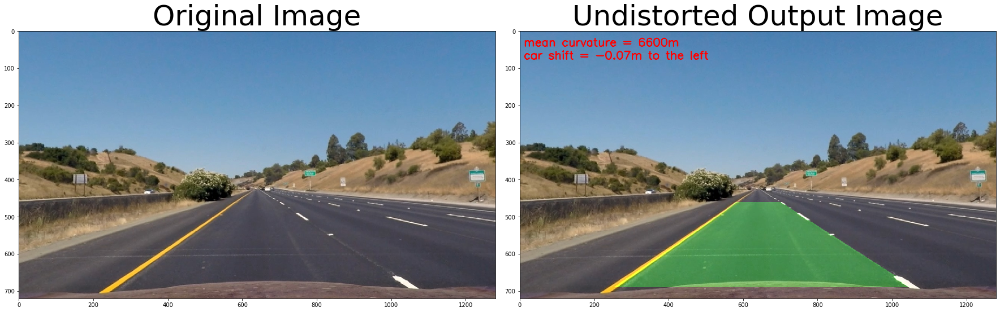

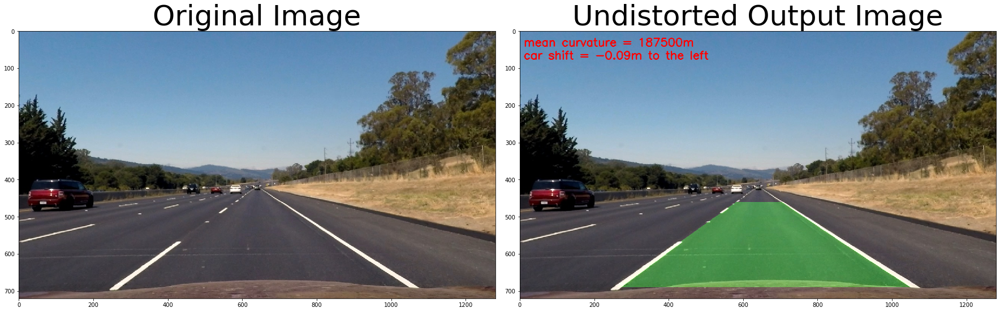

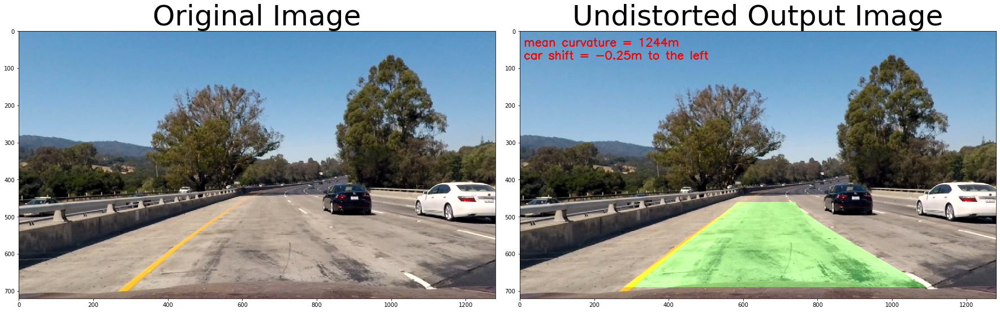

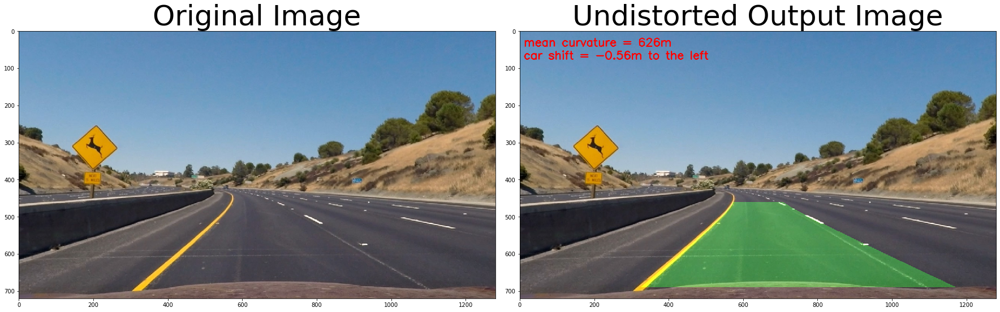

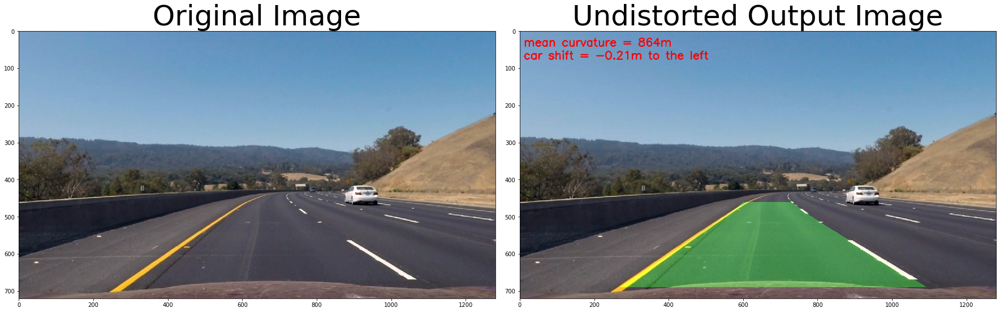

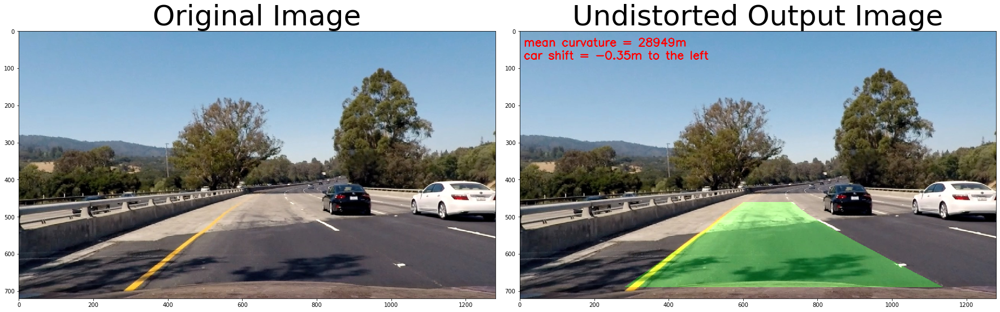

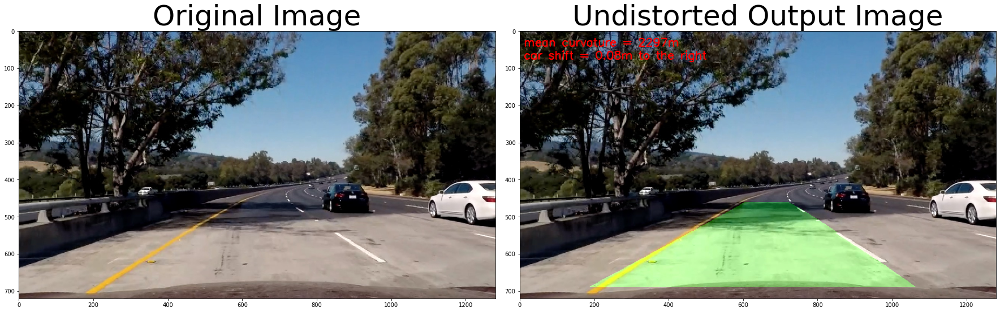

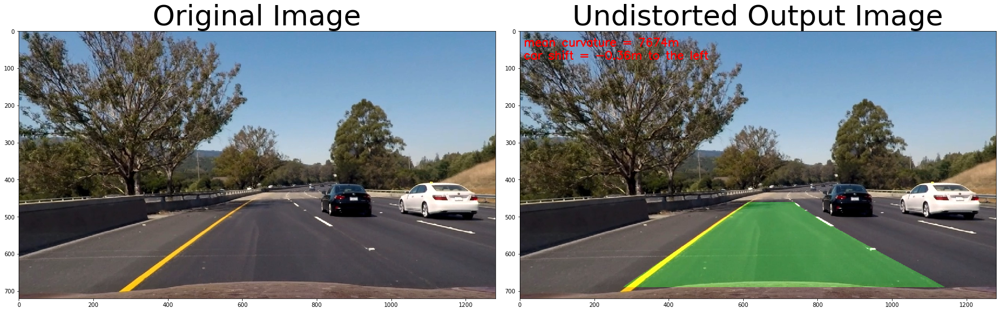

In [27]:
import os


os.listdir("test_images/")
c_mtx, c_dist = camera_matrix() #return mtx, dist
pict_list = os.listdir("test_images/")
start = True
for pict in pict_list:
    img = cv2.imread("test_images/" + pict)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # undistort image
    undist_img = cal_undistort(img, c_mtx, c_dist)
    
##### End Threshold and mask, undistort and warp with different color channels / color spaces
    # RGB color space
    ### only R channel
    R_channel = undist_img[:,:,0]
    #R_comb_bin = combined_thresh(R_channel, SOBEL_KERNEL=3, THRESH=(210, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.7, 1.2))
    #R_comb_bin = dir_threshold(channel_tresh(R_channel,CHL_TRESH=(210, 255)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    R_comb_bin = channel_tresh(R_channel,CHL_TRESH=(210, 255)) #best pick
    # mask image
    msk_R_bin = region_of_interest(R_comb_bin)#.astype(np.float)

    # HLS color space 
    hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS).astype(np.float)
    ### only H channel
    h1_channel = hls[:,:,0]
    #H_comb_bin = combined_thresh(h1_channel, SOBEL_KERNEL=9, THRESH=(20, 80), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    H_comb_bin = dir_threshold(channel_tresh(h1_channel,CHL_TRESH=(20, 80)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #H_comb_bin = channel_tresh(h1_channel,CHL_TRESH=(20, 80))
    # mask image
    msk_H_bin = region_of_interest(H_comb_bin)

    ### only S channel
    s1_channel = hls[:,:,2]
    #S_comb_bin = combined_thresh(l1_channel, SOBEL_KERNEL=9, THRESH=(85, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.6, 1.3))
    #S_comb_bin = dir_threshold(channel_tresh(s1_channel,CHL_TRESH=(85, 255)), sobel_kernel=3, dir_thresh=(0.6, 1.3))
    S_comb_bin = channel_tresh(s1_channel,CHL_TRESH=(85, 255)) #best pick
    # mask image
    msk_S_bin = region_of_interest(S_comb_bin)
    ##### End Threshold and mask    

    ### only grayscale cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    G_channel = cv2.cvtColor(undist_img, cv2.COLOR_RGB2GRAY)
    G_comb_bin = combined_thresh(G_channel, SOBEL_KERNEL=3, THRESH=(100, 200), MAG_THRESH=(10, 225), DIR_TRESH=(0.7, 1.2))
    #G_comb_bin = dir_threshold(channel_tresh(G_channel,CHL_TRESH=(100, 200)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #G_comb_bin = channel_tresh(G_channel,CHL_TRESH=(100, 200)) #best pick
    # mask image
    msk_G_bin = region_of_interest(G_comb_bin)#.astype(np.float)

    
    # LUV color space L* beschreibt die Helligkeitsachse und u*,v* die Farbartebene
    Luv = cv2.cvtColor(undist_img, cv2.COLOR_RGB2LUV)
    # only L channel
    l2_channel = Luv[:,:,0]
    #L2_comb_bin = combined_thresh(l2_channel, SOBEL_KERNEL=9, THRESH=(225, 255), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    #L2_comb_bin = dir_threshold(channel_tresh(l2_channel,CHL_TRESH=(225, 255)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    L2_comb_bin = channel_tresh(l2_channel,CHL_TRESH=(225, 255))
    # mask image
    msk_L2_bin = region_of_interest(L2_comb_bin)
    
    # LAB color space L* beschreibt die Helligkeitsachse und u*,v* die Farbartebene
    Lab = cv2.cvtColor(undist_img, cv2.COLOR_RGB2Lab)
    # only B channel
    b3_channel = Lab[:,:,2]
    #B3_comb_bin = combined_thresh(b3_channel, SOBEL_KERNEL=9, THRESH=(155, 200), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    B3_comb_bin = dir_threshold(channel_tresh(b3_channel,CHL_TRESH=(155, 200)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #B3_comb_bin = channel_tresh(b3_channel,CHL_TRESH=(155, 200))
    # mask image
    msk_B3_bin = region_of_interest(B3_comb_bin)    
   

    ##### Add the binary images together
    comb_binary = cv2.bitwise_or(msk_S_bin*1.,cv2.bitwise_or(msk_R_bin*1., msk_B3_bin))
    top_down, perspective_M , inv_M = img_persp(comb_binary)
##### End Threshold and mask, undistort and warp with different color channels / color spaces
################# finding pixels with sliding window and RANSAC
    if start:
        left_fit, right_fit, ploty, out_img, leftx, lefty, rightx, righty = slide_win_poly(top_down, False)
#        L_RAN_xplot, R_RAN_xplot, ploty, out_img, leftx, lefty, rightx, righty = slide_win_poly(top_down, False)
        start = False
    else:
        left_fit, right_fit, out_img, leftx, lefty, rightx, righty = nxt_win_poly(top_down,left_fit, right_fit, False)
    
    y_eval = np.max(ploty)

    # Now our radius of curvature is in meters
    curve_m, dif_pos_car = meas_curvature_m(leftx, lefty, rightx, righty, y_eval)
#    curve_m, dif_pos_car = meas_RAN_curvature_m(leftx, lefty, rightx, righty, y_eval)    
      
    output = project_meas(undist_img, left_fit, right_fit, top_down, curve_m, dif_pos_car)
#    output = project_RAN_meas(undist_img, L_RAN_xplot, R_RAN_xplot,ploty, top_down, curve_m, dif_pos_car)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(undist_img, cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(output, cmap='gray')
    ax2.set_title('Undistorted Output Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)  

    

## Video
For video pipeline I decided to change my code and introduce a class called Line() to make things more easy and to be able to take a mean value over a certain count of frames so that the lane aren't jiggling so much and give a smoother output. The other reason was that I can store the previous values and can take those values if the lane detection fails some frames. More or less I used the functions I showed above, just adapted to the class.

In [28]:
# Define a class to receive the characteristics of each line detection
class Line:
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False 
        self.start = True
        self.Lost_frame = 0
        self.approx = False
        
        # x an y values of the lanes in previous frame
        self.preX = None
        self.preY = None        
        self.x_vals = None
        self.y_vals = None
        self.ploty = None
       
        #polynomial coefficients current
        self.poly_fit0 = None
        self.poly_fit1 = None
        self.poly_fit2 = None

        #polynomial coefficients over the last 30 iterations
        self.all_poly_fit0 = deque(maxlen=30)
        self.all_poly_fit1 = deque(maxlen=30)
        self.all_poly_fit2 = deque(maxlen=30)
        self.all_poly_fitx = deque(maxlen=30)
        
        #polynomial coefficients of the lanes in previous frame
        self.pre_poly_fit0 = None
        self.pre_poly_fit1 = None
        self.pre_poly_fit2 = None
        self.pre_poly_fitx = None

        #radius of curvature of the line
        self.radius_m = None
        self.all_rad_m = deque(maxlen=30)
        #distance in meters of vehicle center from the line
        self.dif_pos_car = None 
        self.all_dif_pos_car = deque(maxlen=30)
        
    
    ### Implementation of a sliding window and Polynomial Fit
    def histo_wind(self, top_down):
        top_down2 = (top_down*255).astype(np.uint8)

        # Take a histogram of the bottom half of the image
        histogram = np.sum(top_down2[int(top_down2.shape[0]/2):,:], axis=0)

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        if self == Left:
            x_base = np.argmax(histogram[:midpoint])
        else:
            x_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(top_down.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = top_down2.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Set the width of the windows +/- margin
        margin = 75
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        lane_inds = []
        
        # Current positions to be updated for each window
        x_current = x_base
        win_x_low = x_current - margin
        win_x_high = x_current + margin        

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = top_down2.shape[0] - (window+1)*window_height
            win_y_high = top_down2.shape[0] - window*window_height

            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            
            if len(good_inds) < 9500:
                # Append these indices to the lists
                lane_inds.append(good_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(lane_inds) > minpix:
                x_current = np.int(np.mean(nonzerox[lane_inds]))

        # Concatenate the arrays of indices
        lane_inds = np.concatenate(lane_inds)

        # Extract line pixel positions
        self.x_vals = nonzerox[lane_inds]
        self.y_vals = nonzeroy[lane_inds] 
        
        if np.sum(self.x_vals) > 0:
            self.detected = True
        else:
            self.detected = False
            self.x_vals = self.preX
            self.y_vals = self.preY
        return 

    
    ### Implementation of a sliding window with polynomial coefficients from previous frame and Polynomial Fit    
    def nxt_win_poly_cl(self, top_down):
        binary_warped= (top_down*255).astype(np.uint8)
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))

        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 75
        lane_inds = ((nonzerox > (self.pre_poly_fit0*(nonzeroy**2) + self.pre_poly_fit1*nonzeroy + \
                                  self.pre_poly_fit2- margin)) & \
                     (nonzerox < (self.pre_poly_fit0*(nonzeroy**2) + self.pre_poly_fit1*nonzeroy + \
                                  self.pre_poly_fit2 + margin))) 

        # Extract line pixel positions
        self.x_vals = nonzerox[lane_inds]
        self.y_vals = nonzeroy[lane_inds] 
        
        if np.sum(self.x_vals) > 0:
            self.detected = True
        else:
            self.detected = False
            self.x_vals = self.preX
            self.y_vals = self.preY
        return
    
    def poly_appr(self, top_down2):
        # Fit a second order polynomial to each
        poly_fit = np.polyfit(self.y_vals, self.x_vals, 2)
        self.poly_fit0 = poly_fit[0] 
        self.poly_fit1 = poly_fit[1] 
        self.poly_fit2 = poly_fit[2]
        self.ploty = np.linspace(0, top_down2.shape[0]-1, top_down2.shape[0])
        return 
    
    def poly_calc_save(self, damp):

        #polynomial coefficients over the last 30 iterations with damping
        S_fit0 = np.mean(self.all_poly_fit0) + damp*(self.poly_fit0 - np.mean(self.all_poly_fit0))
        S_fit1 = np.mean(self.all_poly_fit1) + damp*(self.poly_fit1 - np.mean(self.all_poly_fit1))
        S_fit2 = np.mean(self.all_poly_fit2) + damp*(self.poly_fit2 - np.mean(self.all_poly_fit2))
        S_end_poly_fitx = S_fit0*self.ploty**2 + S_fit1*self.ploty +S_fit2
        
        if damp > 0:
            self.poly_fit0 = S_fit0
            self.poly_fit1 = S_fit1
            self.poly_fit2 = S_fit2

            self.all_poly_fit0 = S_fit0
            self.all_poly_fit1 = S_fit1
            self.all_poly_fit2 = S_fit2

            self.pre_poly_fit0 = S_fit0
            self.pre_poly_fit1 = S_fit1
            self.pre_poly_fit2 = S_fit2
            self.pre_poly_fitx = S_end_poly_fitx
            
        y_eval = np.max(self.ploty)
        self.all_rad_m = self.LaR_meas_curvature_m(y_eval)
        self.all_dif_pos_car = self.LaR_calc_lane_cl_m(y_eval)
        return S_end_poly_fitx
    
    def save_param_io(self, S_poly_fitx):
        self.all_poly_fit0 = self.poly_fit0
        self.all_poly_fit1 = self.poly_fit1
        self.all_poly_fit2 = self.poly_fit2
        self.all_poly_fitx = S_poly_fitx

        #polynomial coefficients over the last 20 iterations
        self.pre_poly_fit0 = self.poly_fit0
        self.pre_poly_fit1 = self.poly_fit1
        self.pre_poly_fit2 = self.poly_fit2
        self.pre_poly_fitx = S_poly_fitx
        self.preX = self.x_vals
        self.preY = self.y_vals
        y_eval = np.max(self.ploty)
        self.all_rad_m = self.LaR_meas_curvature_m(y_eval)
        self.all_dif_pos_car = self.LaR_calc_lane_cl_m(y_eval)
        return
    
    def LaR_meas_curvature_m(self, y_eval):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Fit new polynomials to x,y in world space 
        S_fit_cr = np.polyfit(self.preY*ym_per_pix, self.preX*xm_per_pix, 2)

        # Calculate the new radii of curvature
        curve_m = ((1 + (2*S_fit_cr[0]*y_eval*ym_per_pix + S_fit_cr[1])**2)**1.5) / np.absolute(2*S_fit_cr[0])
        return curve_m

    def LaR_calc_lane_cl_m(self, y_eval):
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        S_fit_cr = np.polyfit(self.preY*ym_per_pix, self.preX*xm_per_pix, 2)
        
        lane_pos = S_fit_cr[0]*(y_eval*ym_per_pix)**2 + S_fit_cr[1]*y_eval*ym_per_pix + S_fit_cr[2]         
        return lane_pos

In [29]:
def project_meas_cl(undist, left_fitx, right_fitx, ploty, binary_warped, curve_m, dif_pos_car ):
# Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
#    # Generate x and y values for plotting
#    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])    
#    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp,inv_M, (undist.shape[1], undist.shape[0])) 
      
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # put text on the image
    text_curve = 'mean curvature = ' + str(curve_m) + 'm'
    if dif_pos_car < 0:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the left'
    else:
        text_dif = 'car shift = ' + str(dif_pos_car) + 'm to the right'
        
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,text_curve,(10,40), font, 1,(255,0,0),2,cv2.LINE_AA)
    cv2.putText(result,text_dif,(10,75), font, 1,(255,0,0),2,cv2.LINE_AA)
    
    return result

In [30]:
def meas_curvature_cl_m(y_eval):
          
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    mid_pos_car = 1280/2*xm_per_pix

    left_curve_m = np.mean(Left.all_rad_m)
    right_curve_m = np.mean(Right.all_rad_m)
    curve_m =int((left_curve_m+right_curve_m)/2+0.5)
    
    left_pos_lane = np.mean(Left.all_dif_pos_car)
    right_pos_lane = np.mean(Right.all_dif_pos_car)
    mid_pos_lane = (left_pos_lane+right_pos_lane)/2
    dif_pos_car = int((mid_pos_car-mid_pos_lane)*100+0.5)/100  
    
    return curve_m, dif_pos_car

# Video Pipeline
To get the pipeline robust I add two features:
First I introduced the possibility to check which threshold / color space or color channel would be the best pick for lane identification in comparison to the previous calculated polynomial fit. Those threshold are appended to the comb_bin_stack array and used afterwards in the for – loop. This wourld also give the possibility to use different 'sets' for left and right side (a better pre-selection to reduce time in the loop). 

The measure for the quality of the current lane line detection and the previous polynomial fit is the absolute error between those lines.

Having chosen the best binary image combination and calculated the polynomial fit I established a quality check with the calculation of the curve flection with means of the first polynomial coefficient and the position of the lane with the  3rd  polynomial coefficient.

Then in the further steps if the position (shift) and the flection is below certain values the current data set is added to the mean value stack without changes. Otherwise a damping value is added or if the values indicate that the identified lane is completely untrustable it's dismissed and the previous values are taken and shown.

In [31]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [32]:
def process_image(image):
    # defining global values
    global start
    global c_mtx
    global c_dist
    # convert img to RGB
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # undistort image
    undist_img = cal_undistort(img, c_mtx, c_dist)
    
##### Start Threshold and mask
    comb_bin_stack=[]

    # RGB color space
    ### only R channel
    R_channel = undist_img[:,:,0]
    #R_comb_bin = combined_thresh(R_channel, SOBEL_KERNEL=3, THRESH=(210, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.7, 1.2))
    #R_comb_bin = dir_threshold(channel_tresh(R_channel,CHL_TRESH=(210, 255)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    R_comb_bin = channel_tresh(R_channel,CHL_TRESH=(210, 255)) #best pick
    # mask image
    msk_R_bin = region_of_interest(R_comb_bin)#.astype(np.float)
    comb_bin_stack.append(msk_R_bin*1.)

    ### only grayscale cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    G_channel = cv2.cvtColor(undist_img, cv2.COLOR_RGB2GRAY)
    G_comb_bin = combined_thresh(G_channel, SOBEL_KERNEL=3, THRESH=(100, 200), MAG_THRESH=(10, 225), DIR_TRESH=(0.7, 1.2))
    #G_comb_bin = dir_threshold(channel_tresh(G_channel,CHL_TRESH=(100, 200)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #G_comb_bin = channel_tresh(G_channel,CHL_TRESH=(100, 200)) #best pick
    # mask image
    msk_G_bin = region_of_interest(G_comb_bin)#.astype(np.float)
    comb_bin_stack.append(msk_G_bin)
    
    # HLS color space 
    hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS).astype(np.float)
    ### only H channel
    h1_channel = hls[:,:,0]
    #H_comb_bin = combined_thresh(h1_channel, SOBEL_KERNEL=9, THRESH=(20, 80), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    H_comb_bin = dir_threshold(channel_tresh(h1_channel,CHL_TRESH=(20, 80)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #H_comb_bin = channel_tresh(h1_channel,CHL_TRESH=(20, 80))
    # mask image
    msk_H_bin = region_of_interest(H_comb_bin)
    comb_bin_stack.append(msk_H_bin*1.)
    
    ### only S channel
    s1_channel = hls[:,:,2]
    #S_comb_bin = combined_thresh(l1_channel, SOBEL_KERNEL=9, THRESH=(85, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.6, 1.3))
    #S_comb_bin = dir_threshold(channel_tresh(s1_channel,CHL_TRESH=(85, 255)), sobel_kernel=3, dir_thresh=(0.6, 1.3))
    S_comb_bin = channel_tresh(s1_channel,CHL_TRESH=(85, 255)) #best pick
    # mask image
    msk_S_bin = region_of_interest(S_comb_bin)
    ##### End Threshold and mask 
    comb_bin_stack.append(msk_S_bin*1.)
  
    # LUV color space L* beschreibt die Helligkeitsachse und u*,v* die Farbartebene
    Luv = cv2.cvtColor(undist_img, cv2.COLOR_BGR2LUV)
    # only L channel
    l2_channel = Luv[:,:,0]
    #L2_comb_bin = combined_thresh(l2_channel, SOBEL_KERNEL=9, THRESH=(225, 255), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    #L2_comb_bin = dir_threshold(channel_tresh(l2_channel,CHL_TRESH=(225, 255)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    L2_comb_bin = channel_tresh(l2_channel,CHL_TRESH=(225, 255))
    # mask image
    msk_L2_bin = region_of_interest(L2_comb_bin)
    comb_bin_stack.append(msk_L2_bin*1.)
    
    # LAB color space L* beschreibt die Helligkeitsachse und u*,v* die Farbartebene
    Lab = cv2.cvtColor(undist_img, cv2.COLOR_BGR2Lab)
    # only B channel
    b3_channel = Lab[:,:,2]
    #B3_comb_bin = combined_thresh(b3_channel, SOBEL_KERNEL=9, THRESH=(155, 200), MAG_THRESH=(60, 255), DIR_TRESH=(0.7, 1.2))#best pick
    B3_comb_bin = dir_threshold(channel_tresh(b3_channel,CHL_TRESH=(155, 200)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    #B3_comb_bin = channel_tresh(b3_channel,CHL_TRESH=(155, 200))
    # mask image
    msk_B3_bin = region_of_interest(B3_comb_bin) 
    comb_bin_stack.append(msk_B3_bin*1.)
    
    ##### Add the binary images together

#    comb_binary = cv2.bitwise_or(msk_R_bin*1.,cv2.bitwise_or(msk_S_bin, msk_H_bin))

    R_comb_bin_stack = comb_bin_stack

########## identify pixels in binary image - calculate polynoms for left and right side
## Left side
    if Left.start == True:
        img = comb_bin_stack[1]

        top_down, perspective_M , inv_M = img_persp(img)    
        Left.histo_wind(top_down)    
        Left.poly_appr(top_down)
        L_poly_fitx =  Left.poly_fit0*Left.ploty**2 + Left.poly_fit1*Left.ploty+Left.poly_fit2
        Left.save_param_io(L_poly_fitx)      
        L_end_poly_fitx = L_poly_fitx      
        Left.start = False
    else:
        # choose best binary image (combination) for the current situation
        # comparing to the previous polynom
        L_best_pick_error = 1000.        
        L_Img_best_pick = comb_bin_stack[-1]        
        for img in comb_bin_stack:
            top_down, perspective_M , inv_M = img_persp(img)
            if Left.approx == True: # perform search with previous polynom
                Left.nxt_win_poly_cl(top_down)        
            if Left.approx == False: # perform search with histogram
                Left.histo_wind(top_down)        
            Left.poly_appr(top_down)        
            L_poly_fitx =  Left.poly_fit0*Left.ploty**2 + Left.poly_fit1*Left.ploty+Left.poly_fit2
            L_all_poly_fitx = np.mean(Left.all_poly_fit0)*Left.ploty**2 + np.mean(Left.all_poly_fit1)*Left.ploty \
                            +np.mean(Left.all_poly_fit2)
            L_all_abs_err = mean_absolute_error(L_all_poly_fitx, L_poly_fitx)
            if L_all_abs_err < L_best_pick_error and Left.detected == True:
                L_best_pick_error = L_all_abs_err
                L_Img_best_pick = img

        ################# finding pixels with sliding window and polyfit and the best pick image               
        if Left.approx == True: # perform search with previous polynom
            top_down1, perspective_M , inv_M = img_persp(L_Img_best_pick)
            Left.nxt_win_poly_cl(top_down1)
        if Left.approx == False: # perform search with histogram
            top_down1, perspective_M , inv_M = img_persp(L_Img_best_pick)
            Left.histo_wind(top_down1)            
        Left.poly_appr(top_down1)            
        # calculate the current polynom with the best fitting binary image
        L_poly_fitx =  Left.poly_fit0*Left.ploty**2 + Left.poly_fit1*Left.ploty+Left.poly_fit2       
        L_all_poly_fitx = np.mean(Left.all_poly_fit0)*Left.ploty**2 + np.mean(Left.all_poly_fit1)*Left.ploty \
                            +np.mean(Left.all_poly_fit2)
        L_pre_poly_fitx = Left.pre_poly_fitx
        # 1. calculate error
        L_pre_abs_err = mean_absolute_error(L_pre_poly_fitx, L_poly_fitx)
        L_all_abs_err = mean_absolute_error(L_all_poly_fitx, L_poly_fitx)
        # 2. check quality of curvature lh / rh with pre
        L_flect_current = Left.poly_fit0
        L_flect_all = np.mean(Left.all_poly_fit0)
        dif_L_Flect = abs(L_flect_current-L_flect_all)
        # 3. check quality of lane position lh / rh with pre        
        L_shift_current = Left.poly_fit2
        L_shift_all = np.mean(Left.all_poly_fit2)
        dif_L_shift = abs(L_shift_current-L_shift_all)
        
        y_eval = np.max(Left.ploty)        
        # if certain value are not reached - everything is fine - add date 
        if dif_L_shift < 50 and (dif_L_Flect*1.e+5) < 7.:
            Left.Lost_frame =0
            damp = 1.
            L_end_poly_fitx = Left.poly_calc_save(damp)
            # pixels in next frame can be detected with polynom
            Left.approx = True
        else:
            # if values are not quite as good introduce the value with damping
            # better search for pixels in next frame with histogram
            Left.approx = False
            if dif_L_shift < 150 and (dif_L_Flect*1.e+5) < 12.:
                damp = 0.05
            # else if values are worse take the previous values
            else:
                damp = 0
            Left.Lost_frame +=1
            if Left.Lost_frame > 8:              
                Left.Lost_frame =0
            L_end_poly_fitx = Left.poly_calc_save(damp)        

########## Right side            
    if Right.start == True:
        img = R_comb_bin_stack[0]

        top_down, perspective_M , inv_M = img_persp(img)
        Right.histo_wind(top_down)         
        Right.poly_appr(top_down)
        R_poly_fitx =  Right.poly_fit0*Right.ploty**2 + Right.poly_fit1*Right.ploty+Right.poly_fit2        
        Right.save_param_io(R_poly_fitx)
        R_end_poly_fitx = R_poly_fitx            
        Right.start = False
    else:
        # choose best binary image (combination) for the current situation
        # comparing to the previous polynom
        R_best_pick_error = 1000.
        R_Img_best_pick = R_comb_bin_stack[0]
        for img in R_comb_bin_stack:
            top_down, perspective_M , inv_M = img_persp(img)
        ################# finding pixels with sliding window and polyfit
            if Right.approx == True: # perform search with previous polynom  
                Right.nxt_win_poly_cl(top_down)    
            if Right.approx == False: # perform search with histogram
                Right.histo_wind(top_down)      
            Right.poly_appr(top_down)
            R_poly_fitx =  Right.poly_fit0*Right.ploty**2 + Right.poly_fit1*Right.ploty+Right.poly_fit2        
            R_all_poly_fitx = np.mean(Right.all_poly_fit0)*Right.ploty**2 + np.mean(Right.all_poly_fit1)*Right.ploty \
                            +np.mean(Right.all_poly_fit2) 
            R_all_abs_err = mean_absolute_error(R_all_poly_fitx, R_poly_fitx)
            if R_all_abs_err < R_best_pick_error and Right.detected == True:
                R_best_pick_error = R_all_abs_err
                R_Img_best_pick = img
                
        ################# finding pixels with sliding window and polyfit and the best pick image               
        if Right.approx == True: # perform search with previous polynom
            top_down2, perspective_M , inv_M = img_persp(R_Img_best_pick)
            Right.nxt_win_poly_cl(top_down2)    
        if Right.approx == False: # perform search with histogram
            top_down2, perspective_M , inv_M = img_persp(R_Img_best_pick)
            Right.histo_wind(top_down2)      
        Right.poly_appr(top_down2)
        # calculate the current polynom with the best fitting binary image        
        R_poly_fitx =  Right.poly_fit0*Right.ploty**2 + Right.poly_fit1*Right.ploty+Right.poly_fit2       
        R_all_poly_fitx = np.mean(Right.all_poly_fit0)*Right.ploty**2 + np.mean(Right.all_poly_fit1)*Right.ploty \
                            +np.mean(Right.all_poly_fit2)
        R_pre_poly_fitx = Right.pre_poly_fitx
        # 1. calculate error        
        R_pre_abs_err = mean_absolute_error(R_pre_poly_fitx, R_poly_fitx)
        R_all_abs_err = mean_absolute_error(R_all_poly_fitx, R_poly_fitx)                
        # 2. check quality of curvature lh / rh with pre
        R_flect_current = Right.poly_fit0
        R_flect_all = np.mean(Right.all_poly_fit0)
        dif_R_Flect = abs(R_flect_current-R_flect_all)
        # 3. check quality of lane position lh / rh with pre        
        R_shift_current = Right.poly_fit2
        R_shift_all = np.mean(Right.all_poly_fit2)
        dif_R_shift = abs(R_shift_current-R_shift_all)
        y_eval = np.max(Right.ploty)
        # if certain values are not reached - everything is fine - add date 
        if dif_R_shift < 50 and (dif_R_Flect*1.e+5) < 7.:
            damp = 1.
            Right.Lost_frame =0
            R_end_poly_fitx = Right.poly_calc_save(damp)
            # pixels in next frame can be detected with polynom
            Right.approx = True
        else:
            # if values are not quite as good introduce the value with damping
            # better search for pixels in next frame with histogram
            Right.approx = False
            if dif_R_shift < 150 and (dif_R_Flect*1.e+5) < 15.:
                damp = 0.15
            # else if values are worse take the previous values
            else:
                damp = 0
            Right.Lost_frame +=1
            if Right.Lost_frame > 10:
                Right.Lost_frame = 0
            R_end_poly_fitx = Right.poly_calc_save(damp)
################# end finding pixels with sliding window and polyfit
    
################# calculating curvature and position    
    y_eval = np.max(Left.ploty)
    curve_m, dif_pos_car = meas_curvature_cl_m(y_eval)
    output = project_meas_cl(undist_img, L_end_poly_fitx, R_end_poly_fitx, Left.ploty, top_down, curve_m, dif_pos_car )

###################################################################
    # convert frame back to BGR
    output = cv2.cvtColor(output, cv2.COLOR_RGB2BGR)
    return output

In [33]:
start = True
Right = Line()
Left = Line()
c_mtx, c_dist = camera_matrix() #return mtx, dist
project_output = 'P4_adv_lane_lines_challenge_video_001.mp4'
#clip1 = VideoFileClip("project_video.mp4")
clip1 = VideoFileClip("challenge_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

Moviepy - Building video P4_adv_lane_lines_challenge_video_001.mp4.
Moviepy - Writing video P4_adv_lane_lines_challenge_video_001.mp4



Moviepy - Done !
Moviepy - video ready P4_adv_lane_lines_challenge_video_001.mp4
Wall time: 5min 15s


In [34]:
 HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(project_output))